In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline


import seaborn as sns


In [0]:
from google.colab import files
files.upload()

Saving formatted_files.csv to formatted_files.csv


{'formatted_files.csv': b',arr_delay,name\r\n0,11.0,United Air Lines Inc.\r\n1,20.0,United Air Lines Inc.\r\n2,33.0,American Airlines Inc.\r\n3,-18.0,JetBlue Airways\r\n4,-25.0,Delta Air Lines Inc.\r\n5,12.0,United Air Lines Inc.\r\n6,19.0,JetBlue Airways\r\n7,-14.0,ExpressJet Airlines Inc.\r\n8,-8.0,JetBlue Airways\r\n9,8.0,American Airlines Inc.\r\n10,-2.0,JetBlue Airways\r\n11,-3.0,JetBlue Airways\r\n12,7.0,United Air Lines Inc.\r\n13,-14.0,United Air Lines Inc.\r\n14,31.0,American Airlines Inc.\r\n15,-4.0,JetBlue Airways\r\n16,-8.0,United Air Lines Inc.\r\n17,-7.0,JetBlue Airways\r\n18,12.0,Envoy Air\r\n19,-6.0,JetBlue Airways\r\n20,-8.0,Delta Air Lines Inc.\r\n21,16.0,Envoy Air\r\n22,-12.0,American Airlines Inc.\r\n23,-8.0,Delta Air Lines Inc.\r\n24,-17.0,United Air Lines Inc.\r\n25,32.0,Envoy Air\r\n26,14.0,United Air Lines Inc.\r\n27,4.0,JetBlue Airways\r\n28,-21.0,JetBlue Airways\r\n29,-9.0,Delta Air Lines Inc.\r\n30,3.0,US Airways Inc.\r\n31,5.0,American Airlines Inc.\r\n32,1.

In [0]:
flight_df = pd.read_csv('formatted_files.csv')
flight_df['arr_delay'].describe()

count    317113.000000
mean          1.297143
std          29.064401
min         -60.000000
25%         -17.000000
50%          -6.000000
75%          11.000000
max         120.000000
Name: arr_delay, dtype: float64

In [0]:
flight_df.head()

,Unnamed: 0,arr_delay,name
0,0,11.0,United Air Lines Inc.
1,1,20.0,United Air Lines Inc.
2,2,33.0,American Airlines Inc.
3,3,-18.0,JetBlue Airways
4,4,-25.0,Delta Air Lines Inc.


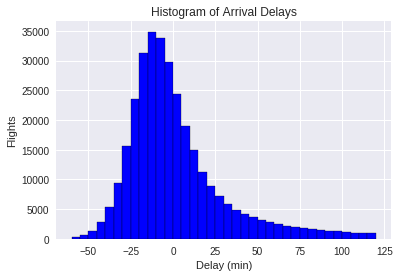

In [0]:
# Make the histogram using matplotlib, bins must be integet
plt.hist(flight_df['arr_delay'], color = 'blue', edgecolor = 'black',bins = int(180/5))

# Add labels
plt.title('Histogram of Arrival Delays')
plt.xlabel('Delay (min)')
plt.ylabel('Flights');

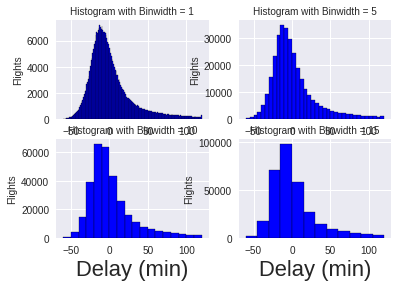

<Figure size 1080x1080 with 0 Axes>

In [0]:
# Show 4 different binwidths
for i, binwidth in enumerate([1, 5, 10, 15]):
    
    # Set up the plot
    ax = plt.subplot(2, 2, i + 1)
    
    # Draw the plot
    ax.hist(flight_df['arr_delay'], bins = int(180/binwidth),
             color = 'blue', edgecolor = 'black')
    
    # Title and labels
    ax.set_title('Histogram with Binwidth = %d' % binwidth, size = 10)
    ax.set_xlabel('Delay (min)', size = 22)
    ax.set_ylabel('Flights', size= 10)
plt.figure(figsize = (15,15))
plt.tight_layout()
plt.show()

In [0]:
# Extract top five airlines with most flights
carrier_flights = pd.Series(flight_df.groupby('name')['name'].count())
carrier_flights = carrier_flights.sort_values(ascending=False)
top_five = carrier_flights.index[:5]

# Subset to the top 5 airlines
top_five_flights = flight_df[flight_df['name'].isin(top_five)]

In [0]:
top_five

Index(['United Air Lines Inc.', 'JetBlue Airways', 'ExpressJet Airlines Inc.',
       'Delta Air Lines Inc.', 'American Airlines Inc.'],
      dtype='object', name='name')

In [0]:
from IPython.core.pylabtools import figsize

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


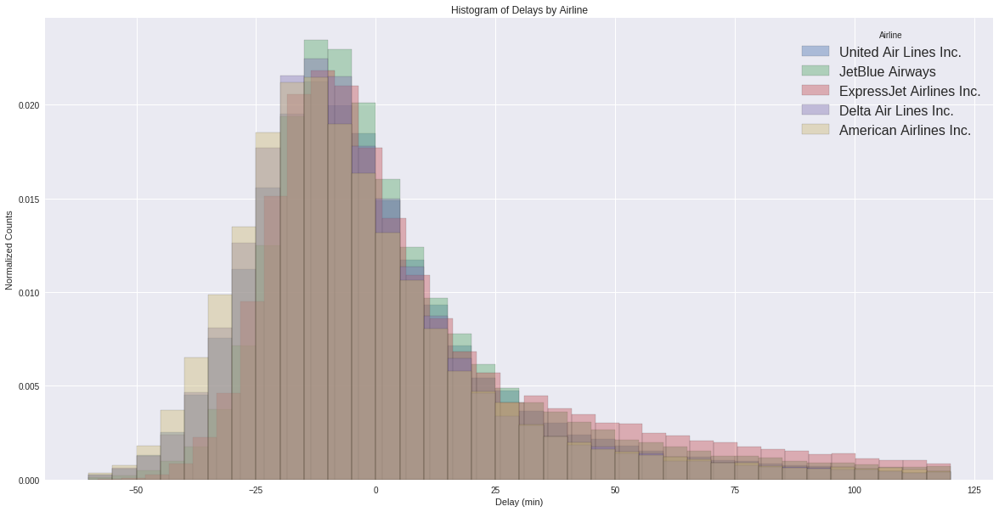

In [0]:
figsize(20,10)
# Iterate through each of the five airlines
for airline in top_five:
    # Subset to the airline
    subset = top_five_flights[top_five_flights['name'] == airline]
    # Make a histogram with the airline
    sns.distplot(subset['arr_delay'], bins = int(180/5),label = airline, hist = True, kde = False,norm_hist=True,hist_kws = {'edgecolor': 'black'})
    
plt.legend(prop={'size': 16}, title = 'Airline')
plt.title('Histogram of Delays by Airline'); plt.xlabel('Delay (min)'); plt.ylabel('Normalized Counts');

/usr/local/lib/python3.6/dist-packages/matplotlib/axes/_axes.py:6521: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  alternative="'density'", removal="3.1")


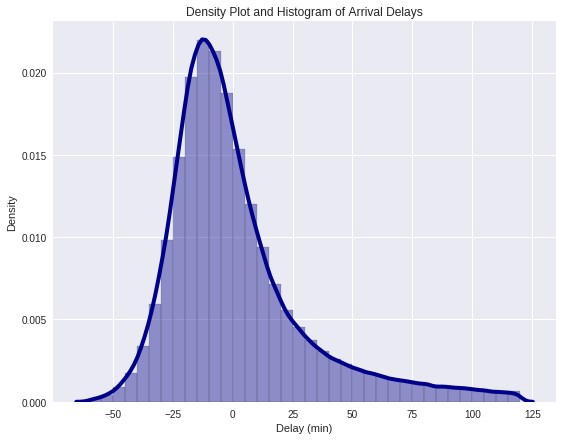

In [0]:
figsize(9, 7)

sns.distplot(flight_df['arr_delay'], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4});

plt.title('Density Plot and Histogram of Arrival Delays'); 
plt.xlabel('Delay (min)'); plt.ylabel('Density');

In [0]:
# Assign colors for each airline and the names
colors = ['#E69F00', '#56B4E9', '#F0E442', '#FFD700', '#D55E00']

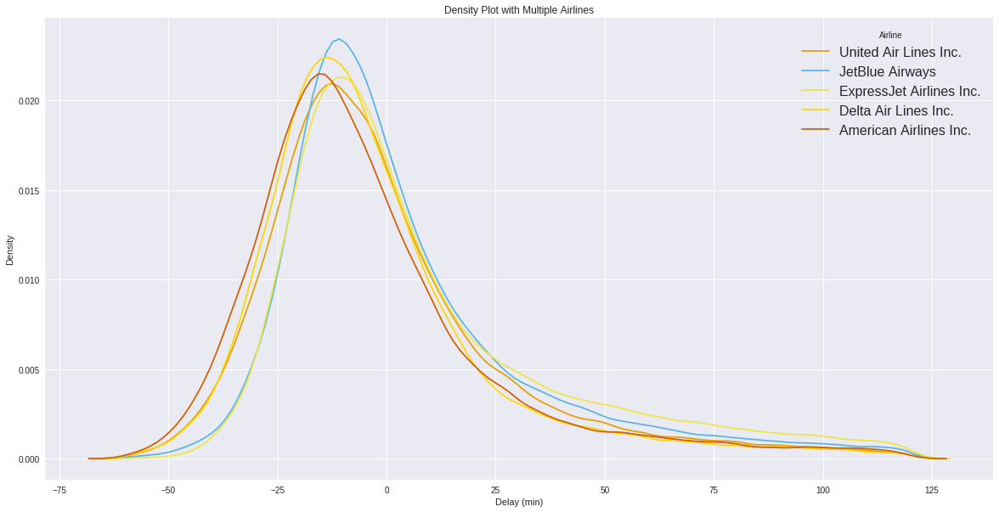

In [0]:
figsize(20, 10)

# List of five airlines to plot
airlines = ['United Air Lines Inc.', 'JetBlue Airways', 'ExpressJet Airlines Inc.',
         'Delta Air Lines Inc.', 'American Airlines Inc.']


target_0 = flight_df[flight_df['name'] == airlines[0]]
target_1 = flight_df[flight_df['name'] == airlines[1]]
target_2 = flight_df[flight_df['name'] == airlines[2]]
target_3 = flight_df[flight_df['name'] == airlines[3]]
target_4 = flight_df[flight_df['name'] == airlines[4]]



sns.distplot(target_0[['arr_delay']], hist=False, kde=True,kde_kws = {"color":colors[0]},label = airlines[0])
sns.distplot(target_1[['arr_delay']], hist=False, kde=True,kde_kws = {"color":colors[1]},label = airlines[1])
sns.distplot(target_2[['arr_delay']], hist=False, kde=True,kde_kws = {"color":colors[2]},label = airlines[2])
sns.distplot(target_3[['arr_delay']], hist=False, kde=True,kde_kws = {"color":colors[3]},label = airlines[3])
sns.distplot(target_4[['arr_delay']], hist=False, kde=True,kde_kws = {"color":colors[4]},label = airlines[4])

# Iterate through the top five airlines
#for airline in airlines:
    # Subset to the airline
##    subset = flight_df[flight_df['name'] == airline]
    
    # Draw the density plot
 #   sns.distplot(subset['arr_delay'], hist = False, kde = True,
 #                kde_kws = {'linewidth': 3,"color":colors[1]},
 #                label = airline)
    
plt.legend(prop={'size': 16}, title = 'Airline')
plt.title('Density Plot with Multiple Airlines')                                                                      
plt.xlabel('Delay (min)')
plt.ylabel('Density');

So,I would likely choose Delta Airlines Inc.  as it has roughly the same probability density(p.d.) at 
$delay = 0$ and also it has the lowest curve in   $delay > 0$.

American Airlines also has roughly the same distribution characteristics in  the $delay >0$ but the fact is it has lower p.d. at $delay = 0$.

That is why I would prefer to board on Delta Airlies Inc. flights.

#Part 2 of the Assignment

In [0]:
flight_df_array = flight_df['arr_delay'].values

In [0]:
type(flight_df_array)

numpy.ndarray

In [0]:
flight_df_array

array([ 11.,  20.,  33., ..., -16.,   1., -25.])

In [0]:
flight_df_array.shape

(317113,)

In [0]:

from scipy import stats


def centrallimittheorem(sampleSize,numSamples):
  result = [None]*numSamples;
  figsize(10,10)
  for i in range(0,numSamples):
    s = np.random.choice(flight_df_array, size=sampleSize);
    result[i] = np.mean(s);

  meanSamples = np.mean(result);
  sd = np.std(result);
  var = np.var(result);

  d = stats.gaussian_kde(result);
  xs = np.linspace(min(result), max(result), 200);
  d.covariance_factor = (lambda : 0.5);
  d._compute_covariance();
  sample = 'Sample size = ' + str(sampleSize)
  plt.title(sample)
  plt.plot(xs, d(xs));
  plt.show();
    #plot(d, xlab="Mean of Samples", ylab="Density", main=paste(c("Sampling Distribution for mean", ""), collapse=""), col="red", type="l");

  print("Mean of the sampling dsitribution = ", meanSamples);
  print("Variance of the sampling dsitribution = ", var);
  print("Standard Deviation = ",sd)

It can be seen that in the $Density$ $ plot$ $ for$  $ multiple$  $ airline$ the spread was much greater than the spread in the first plot. This proves point 1

Just by applying guassian_kde we get a curve quite close to normal distribution,and as sample size increases, the graph becomes more likely a normal distribution.This proves point 2

Point 3,4 can be easily infered from the plots and their corresponding output.


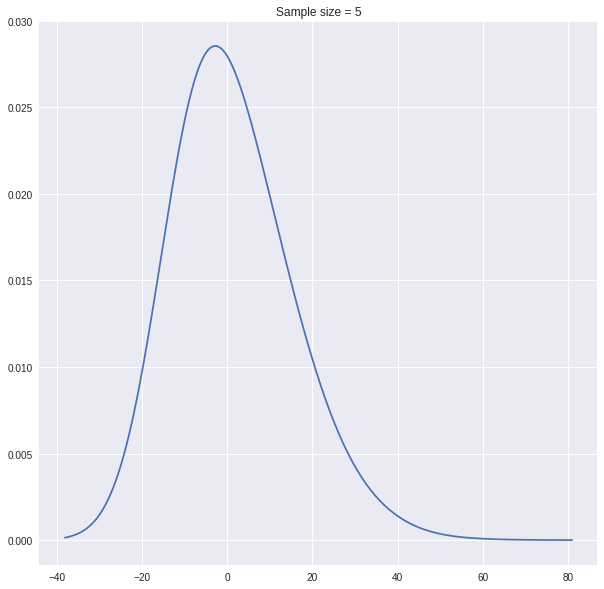

Mean of the sampling dsitribution =  1.2836723817692746
Variance of the sampling dsitribution =  169.29933276305636
Standard Deviation =  13.011507705222188


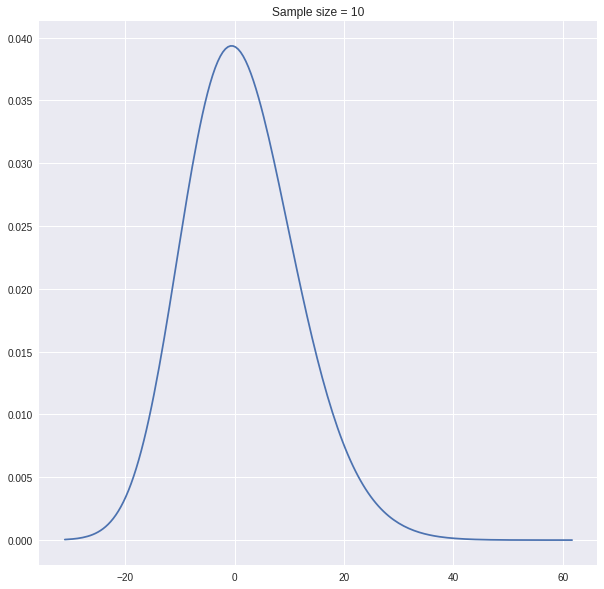

Mean of the sampling dsitribution =  1.3109771595614181
Variance of the sampling dsitribution =  84.3847677910006
Standard Deviation =  9.186118211246827


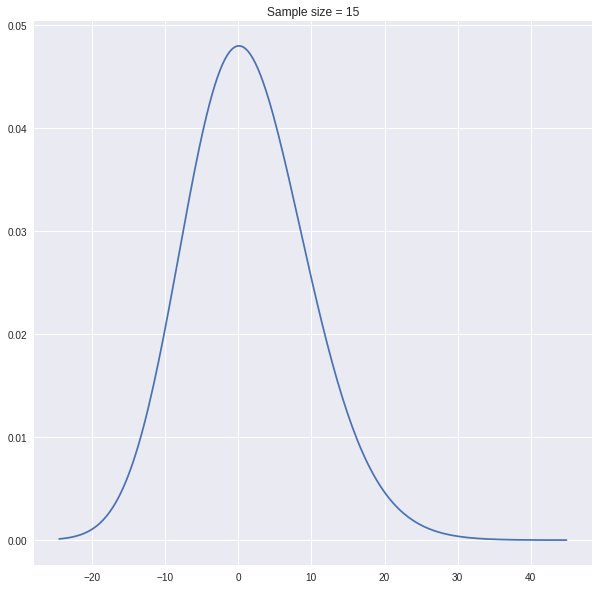

Mean of the sampling dsitribution =  1.3288030870173517
Variance of the sampling dsitribution =  56.38660942336129
Standard Deviation =  7.509101772073761


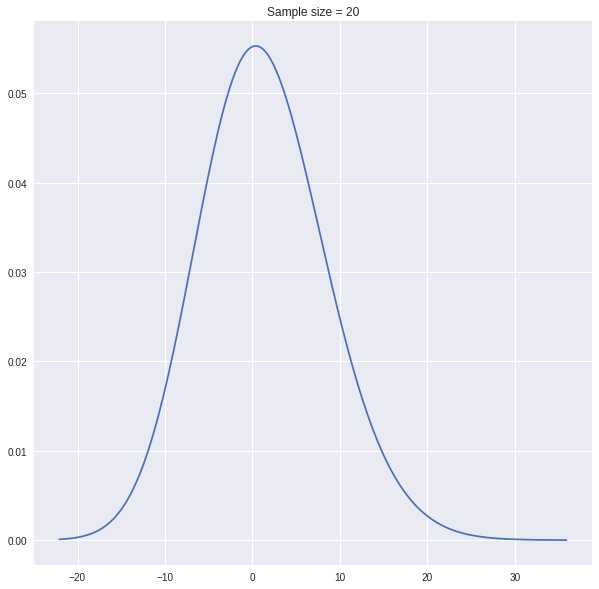

Mean of the sampling dsitribution =  1.2822864404802072
Variance of the sampling dsitribution =  42.24288521565961
Standard Deviation =  6.499452685854372


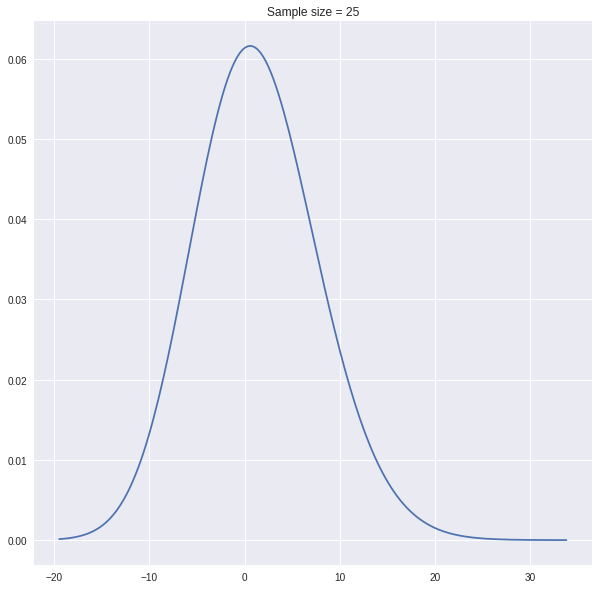

Mean of the sampling dsitribution =  1.3145772011869585
Variance of the sampling dsitribution =  33.89111708551288
Standard Deviation =  5.821607774963278


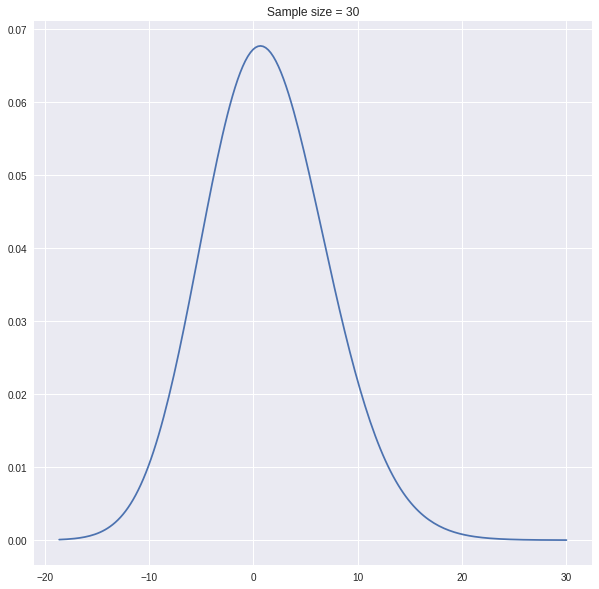

Mean of the sampling dsitribution =  1.2832118729496
Variance of the sampling dsitribution =  28.041193573968116
Standard Deviation =  5.295393618416681


In [0]:
for i in range(5,35,5):
  centrallimittheorem(i,flight_df_array.shape[0])